## Computer Vision - Homework 5

In [33]:
import os
import sys
from typing import List, Optional, Tuple
import numpy as np
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from pathlib import Path
from typing import Union
import plotly.express as px
import random
import re
import copy
from collections import defaultdict
DEFAULT_OUT_DIR: str = os.path.join("..", "output")

### Utils functions

In [34]:
def my_corners_optimized(img: np.ndarray, neighbourhood: int, k: float = 0.04) -> np.ndarray:
    """Compute corners using the Harris operator (vectorized version)."""
    # Ensure neighbourhood is odd
    if neighbourhood % 2 == 0:
        neighbourhood += 1
    
    # Compute the gradients
    dx = np.float32(cv2.Sobel(img, cv2.CV_16S, 1, 0, ksize=3))
    dy = np.float32(cv2.Sobel(img, cv2.CV_16S, 0, 1, ksize=3))
    
    # Compute products of derivatives
    Ixx = dx**2
    Iyy = dy**2
    Ixy = dx*dy
    
    # Apply gaussian blur to smooth the products
    window_size = (neighbourhood, neighbourhood)
    sigma = 0.3 * ((neighbourhood - 1) * 0.5 - 1) + 0.8  # OpenCV's formula for sigma
    sum_x = cv2.GaussianBlur(Ixx, window_size, sigma)
    sum_y = cv2.GaussianBlur(Iyy, window_size, sigma)
    sum_xy = cv2.GaussianBlur(Ixy, window_size, sigma)
    
    # Compute Harris response
    det = (sum_x * sum_y) - (sum_xy**2)
    trace = sum_x + sum_y
    return det - k * (trace**2)

def find_corners(img: np.ndarray, neighbourhood: int, k: float = 0.04, threshold: float = 0.01) -> np.ndarray:
    """Find corners in an image using thresholding."""
    # Convert to float32 if needed
    img_float = img.astype(np.float32) if img.dtype != np.float32 else img
    
    # Use built-in Harris corner detector
    R = cv2.cornerHarris(img_float, neighbourhood, 3, k)
    
    # Apply threshold
    R[R <= threshold * R.max()] = 0
    return R

def color_corners(img: np.ndarray, R: np.ndarray, color: List[int] = [255, 0, 0]) -> np.ndarray:
    """Highlight corners in an image."""
    # Create output image
    out = (cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) if len(img.shape) == 2 
           else img.copy())
    
    # Apply color to corners
    out[R > 0] = color
    return out

def quickshow(img: np.ndarray, size: Optional[float] = None) -> None:
    """
    Utility function to display an image easily.
    
    Args:
        img: Image array to display
        size: Optional square size for the figure
    
    Raises:
        ValueError: If img is None or empty
    """
    if img is None or img.size == 0:
        raise ValueError("Invalid image input")
        
    with plt.style.context('default'):  # Ensure consistent styling
        if size is not None:
            plt.figure(figsize=(size, size))
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        plt.close()  # Clean up resources

def store_img(
    img: np.ndarray, 
    filename: str, 
    dir: Union[str, Path] = DEFAULT_OUT_DIR,
    format: Optional[str] = None
) -> None:
    """
    Save a given image to disk.
    
    Args:
        img: Image array to save
        filename: Name of output file
        dir: Directory to save to
        format: Optional format override (e.g., 'png', 'jpg')
    
    Raises:
        ValueError: If img is None or empty
    """
    if img is None or img.size == 0:
        raise ValueError("Invalid image input")
        
    # Convert to Path object for easier manipulation
    save_dir = Path(dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Ensure filename has extension
    if not format and '.' not in filename:
        filename += '.png'
    
    save_path = save_dir / filename
    plt.imsave(save_path, img, format=format)

def store_fig(
    fig: matplotlib.figure.Figure, 
    filename: str, 
    dir: Union[str, Path] = DEFAULT_OUT_DIR,
    dpi: int = 300
) -> None:
    """
    Save a given figure to disk with high quality settings.
    
    Args:
        fig: Matplotlib figure to save
        filename: Name of output file
        dir: Directory to save to
        dpi: Resolution for the output image
    
    Raises:
        ValueError: If fig is None
    """
    if fig is None:
        raise ValueError("Invalid figure input")
        
    # Convert to Path object
    save_dir = Path(dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Ensure filename has extension
    if '.' not in filename:
        filename += '.png'
    
    save_path = save_dir / filename
    fig.savefig(
        save_path,
        bbox_inches="tight",
        facecolor="white",
        dpi=dpi,
        pad_inches=0.1
    )

In [35]:
def find_descriptors(img: np.ndarray) -> Tuple[List[cv2.KeyPoint], np.ndarray]:
    """
    Compute interest points of an image and their SIFT feature descriptors.
    
    Args:
        img: Input image array
        
    Returns:
        Tuple of (keypoints, descriptors)
        
    Raises:
        ValueError: If image is empty or None
    """
    if img is None or img.size == 0:
        raise ValueError("Invalid input image")

    # Convert color images to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) if len(img.shape) > 2 else img
    
    # Create SIFT detector and compute descriptors
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_img, None)
    
    if keypoints is None or len(keypoints) == 0:
        raise ValueError("No keypoints found in image")
        
    return keypoints, descriptors

def find_matches(desc1: np.ndarray, desc2: np.ndarray, threshold: float = 0.8) -> List[cv2.DMatch]:
    """
    Compute the best matches between two sets of feature descriptors using FLANN.
    
    Args:
        desc1: First set of descriptors
        desc2: Second set of descriptors
        threshold: Lowe's ratio test threshold
        
    Returns:
        List of good matches that pass the ratio test
        
    Raises:
        ValueError: If descriptors are invalid or empty
    """
    if desc1 is None or desc2 is None or desc1.size == 0 or desc2.size == 0:
        raise ValueError("Invalid descriptors")
    
    try:
        # Convert descriptors to correct format
        desc1 = np.float32(desc1)
        desc2 = np.float32(desc2)
        
        # Configure FLANN matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        
        # Find matches
        raw_matches = flann.knnMatch(desc1, desc2, k=2)
        print(f"Found {len(raw_matches)} raw matches")
        
        # Filter matches using Lowe's ratio test
        good_matches = []
        for matches in raw_matches:
            if len(matches) == 2:
                m, n = matches
                if m.distance < threshold * n.distance:
                    good_matches.append(m)
        
        print(f"Filtered to {len(good_matches)} good matches")
        
        if len(good_matches) < 4:
            raise ValueError(f"Not enough good matches: {len(good_matches)}")
            
        return good_matches
    
    except Exception as e:
        print(f"Error in find_matches: {str(e)}")
        raise

def find_homography(img1: np.ndarray, img2: np.ndarray) -> np.ndarray:
    """
    Find a homography matrix which aligns img2 to img1.
    
    Args:
        img1: First image
        img2: Second image to be aligned to first image
        
    Returns:
        3x3 homography matrix
        
    Raises:
        ValueError: If alignment fails
    """
    try:
        # Find keypoints and descriptors
        print("Finding descriptors for image pair...")
        kp1, desc1 = find_descriptors(img1)
        kp2, desc2 = find_descriptors(img2)
        
        print(f"Found {len(kp1)} keypoints in first image")
        print(f"Found {len(kp2)} keypoints in second image")
        
        # Find matches between descriptors
        matches = find_matches(desc1, desc2)
        print(f"Found {len(matches)} matches between images")
        
        # Extract matching points
        points1 = np.float32([kp1[m.queryIdx].pt for m in matches])
        points2 = np.float32([kp2[m.trainIdx].pt for m in matches])
        
        # Compute homography
        H = fit_homography(points1, points2)
        print("Successfully computed homography")
        
        return H
        
    except Exception as e:
        print(f"Error in find_homography: {str(e)}")
        raise

def stitch_all(imgs: List[np.ndarray], height: int, width: int, 
               start_index: int = 0) -> np.ndarray:
    """
    Stitch all given images into a panorama.
    
    Args:
        imgs: List of images to stitch
        height: Height of output panorama
        width: Width of output panorama
        start_index: Index of the center image
        
    Returns:
        Stitched panorama image
    """
    if not imgs or start_index >= len(imgs):
        raise ValueError("Invalid input images or start index")
    
    print(f"\nStarting panorama stitching with {len(imgs)} images...")
    print(f"Using image {start_index} as center")
    
    # Initial translation matrix to center the panorama
    T = np.float32([[1, 0, -width//4], 
                    [0, 1, -height//4], 
                    [0, 0, 1]])
    
    def warp_image(img: np.ndarray, H: np.ndarray) -> np.ndarray:
        """Warp an image using given homography."""
        M = np.linalg.pinv(H @ T)
        return cv2.warpPerspective(img, M, (width, height))
    
    # Initialize panorama with center image
    panorama = warp_image(imgs[start_index], np.eye(3))
    print("Initialized panorama with center image")
    
    try:
        # Stitch images to the left
        H_left = np.eye(3)
        for i in range(start_index - 1, -1, -1):
            print(f"\nProcessing left image {i}")
            H_left = find_homography(imgs[i + 1], imgs[i]) @ H_left
            panorama = np.maximum(panorama, warp_image(imgs[i], H_left))
        
        # Stitch images to the right
        H_right = np.eye(3)
        for i in range(start_index + 1, len(imgs)):
            print(f"\nProcessing right image {i}")
            H_right = find_homography(imgs[i - 1], imgs[i]) @ H_right
            panorama = np.maximum(panorama, warp_image(imgs[i], H_right))
        
        print("Successfully completed panorama stitching")
        return panorama
        
    except Exception as e:
        print(f"Error in stitch_all: {str(e)}")
        raise

def fit_homography(points1: np.ndarray, points2: np.ndarray, 
                  ransac_threshold: float = 5.0) -> np.ndarray:
    """
    Find the best homography matrix to align two sets of points using RANSAC.
    
    Args:
        points1: First set of points
        points2: Second set of points
        ransac_threshold: RANSAC reprojection error threshold
        
    Returns:
        3x3 homography matrix
        
    Raises:
        ValueError: If points are invalid or homography cannot be computed
    """
    if len(points1) < 4 or len(points2) < 4:
        raise ValueError("Need at least 4 point pairs to compute homography")
    
    # Reshape points for OpenCV
    pts1 = np.float32(points1).reshape(-1, 1, 2)
    pts2 = np.float32(points2).reshape(-1, 1, 2)
    
    # Compute homography using RANSAC
    H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransac_threshold)
    
    if H is None:
        raise ValueError("Could not compute homography")
        
    return H


def crop_image(img: np.ndarray) -> np.ndarray:
    """
    Remove the empty border around an image.
    
    Args:
        img: Input image
        
    Returns:
        Cropped image without empty borders
    """
    if img is None or img.size == 0:
        raise ValueError("Invalid input image")
    
    # Convert to grayscale if color image
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
        
    # Find non-zero coordinates
    coords = np.nonzero(gray)
    if len(coords[0]) == 0:
        return img  # Return original if no non-zero pixels found
        
    # Get bounding box
    y_min, y_max = coords[0].min(), coords[0].max()
    x_min, x_max = coords[1].min(), coords[1].max()
    
    # Crop the image
    if len(img.shape) == 3:
        return img[y_min:y_max+1, x_min:x_max+1, :]
    else:
        return img[y_min:y_max+1, x_min:x_max+1]

In [36]:
def extract_images_from_file(filepath: str) -> dict:
    """
    Extract multiple images from a single image file containing multiple frames/images.
    
    Args:
        filepath: Path to the input image file
        
    Returns:
        Dictionary of extracted images in RGB format and original size
    """
    # Read the source image in BGR format
    source_img = cv2.imread(filepath)
    if source_img is None:
        raise ValueError(f"Could not read image from {filepath}")
    
    # Convert BGR to RGB for consistent color representation
    source_img = cv2.cvtColor(source_img, cv2.COLOR_BGR2RGB)
    
    # Create a grayscale version for contour detection only
    gray = cv2.cvtColor(source_img, cv2.COLOR_RGB2GRAY)
    
    # Resize to target dimensions if not already correct
    target_height, target_width = 1080, 1920
    if source_img.shape[:2] != (target_height, target_width):
        source_img = cv2.resize(source_img, (target_width, target_height))
        gray = cv2.resize(gray, (target_width, target_height))
    
    # Find contours to separate individual images
    _, thresh = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Sort contours by position (top to bottom, left to right)
    def get_contour_precedence(contour):
        x, y, w, h = cv2.boundingRect(contour)
        return (y // 50) * 1000 + x
    
    contours = sorted(contours, key=get_contour_precedence)
    
    # Extract individual images
    extracted_images = {}
    for idx, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)
        
        # Filter out too small contours
        if w < 50 or h < 50:
            continue
            
        # Extract the image and resize to target dimensions
        img = source_img[y:y+h, x:x+w]
        img = cv2.resize(img, (target_width, target_height))
        
        # Store with a meaningful name
        extracted_images[f'image_{idx}'] = img
    
    return extracted_images

image_0:   <class 'numpy.ndarray'> (1080, 1920, 3)


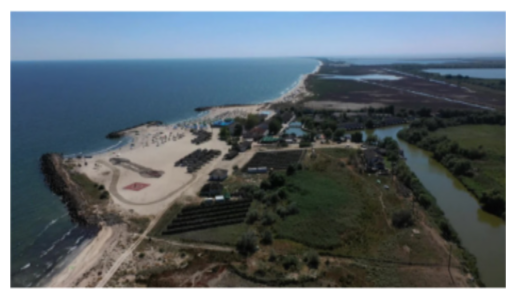

image_1:   <class 'numpy.ndarray'> (1080, 1920, 3)


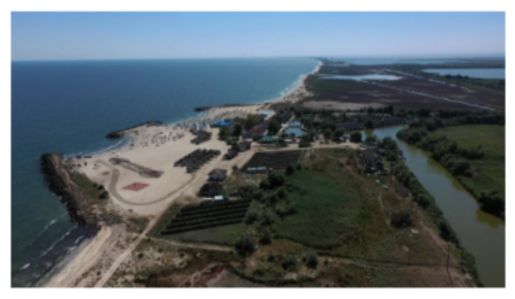

image_23:  <class 'numpy.ndarray'> (1080, 1920, 3)


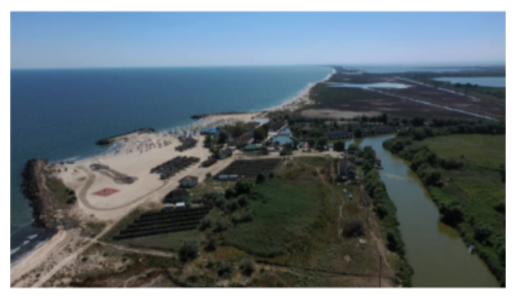

image_24:  <class 'numpy.ndarray'> (1080, 1920, 3)


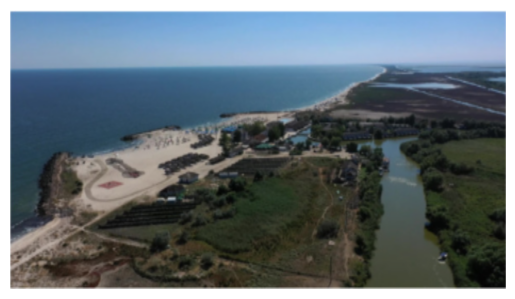

image_25:  <class 'numpy.ndarray'> (1080, 1920, 3)


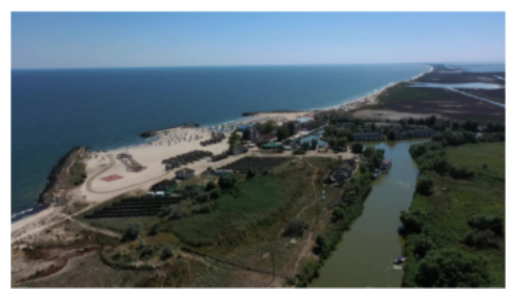

image_26:  <class 'numpy.ndarray'> (1080, 1920, 3)


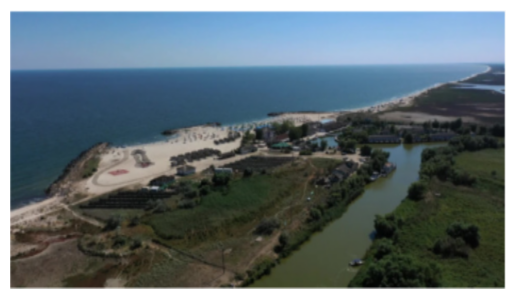

image_27:  <class 'numpy.ndarray'> (1080, 1920, 3)


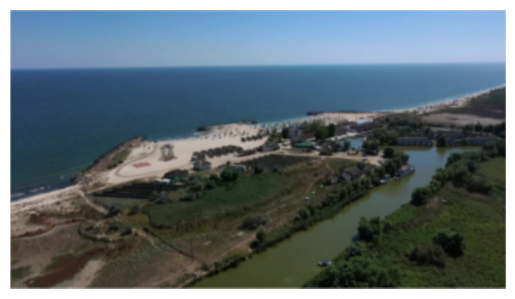

image_28:  <class 'numpy.ndarray'> (1080, 1920, 3)


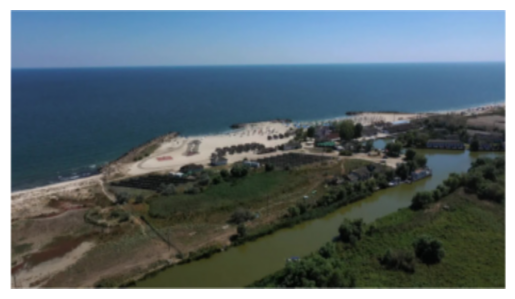

image_29:  <class 'numpy.ndarray'> (1080, 1920, 3)


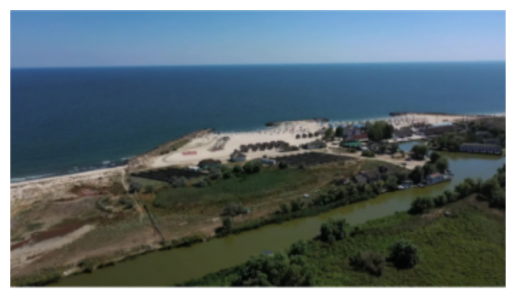

image_31:  <class 'numpy.ndarray'> (1080, 1920, 3)


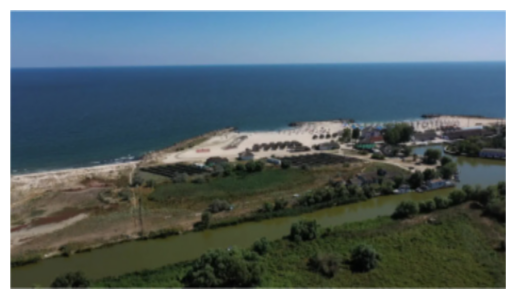

image_32:  <class 'numpy.ndarray'> (1080, 1920, 3)


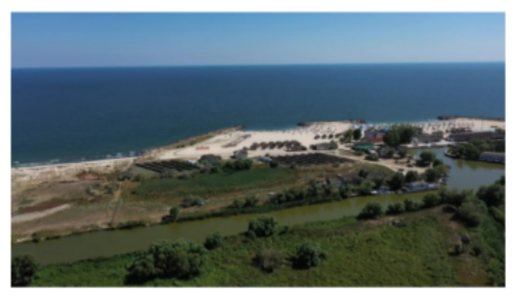

image_33:  <class 'numpy.ndarray'> (1080, 1920, 3)


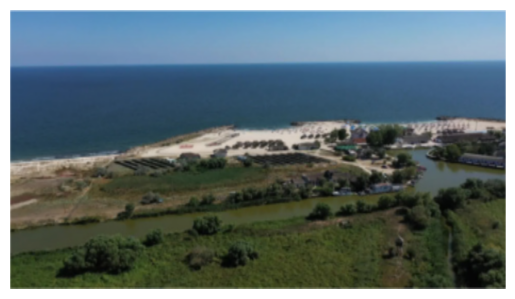

image_34:  <class 'numpy.ndarray'> (1080, 1920, 3)


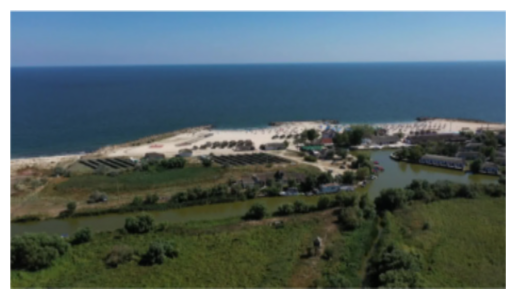

image_36:  <class 'numpy.ndarray'> (1080, 1920, 3)


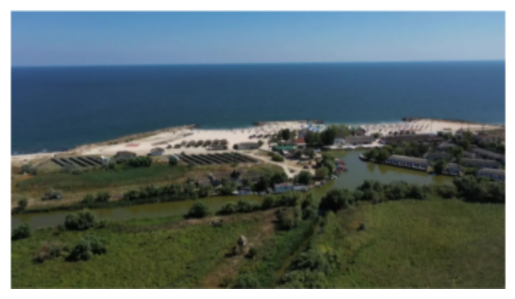

In [37]:
input_file = "inputs_angle.jpg"
imgs_angles = extract_images_from_file(input_file)

# Display results
for name, img in imgs_angles.items():
    print(f"{name+':':10} {type(img)} {img.shape}")
    quickshow(img)

image_0:   <class 'numpy.ndarray'> (1080, 1920, 3)


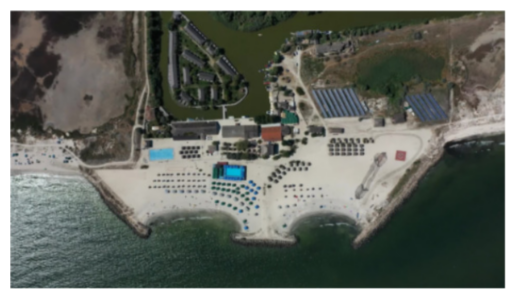

image_1:   <class 'numpy.ndarray'> (1080, 1920, 3)


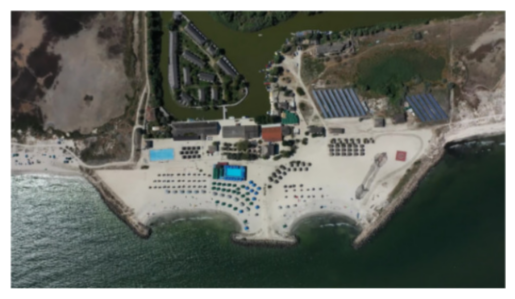

image_15:  <class 'numpy.ndarray'> (1080, 1920, 3)


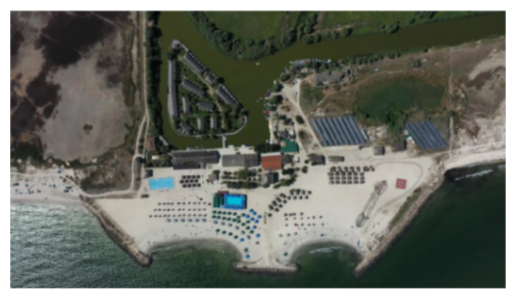

image_16:  <class 'numpy.ndarray'> (1080, 1920, 3)


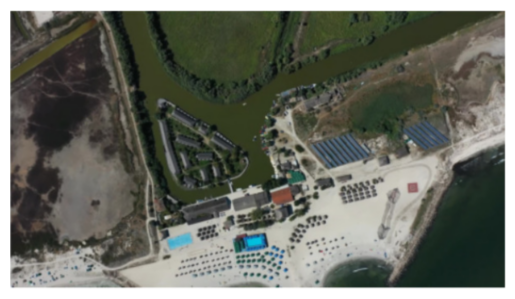

image_20:  <class 'numpy.ndarray'> (1080, 1920, 3)


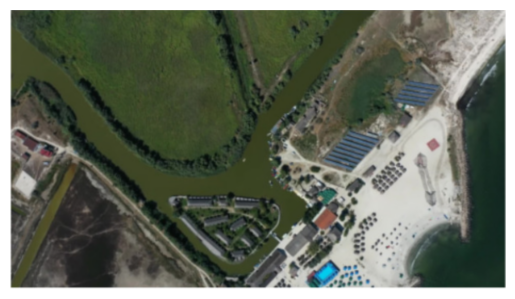

image_22:  <class 'numpy.ndarray'> (1080, 1920, 3)


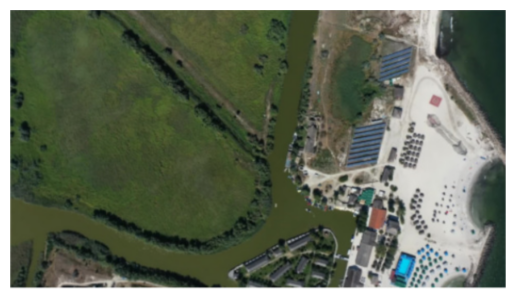

image_25:  <class 'numpy.ndarray'> (1080, 1920, 3)


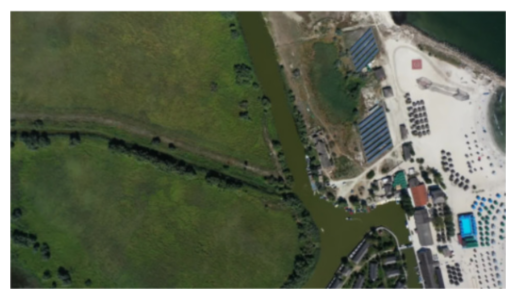

In [38]:
input_file = "inputs_top.jpg"
imgs_top = extract_images_from_file(input_file)

# Display results
for name, img in imgs_top.items():
    print(f"{name+':':10} {type(img)} {img.shape}")
    quickshow(img)

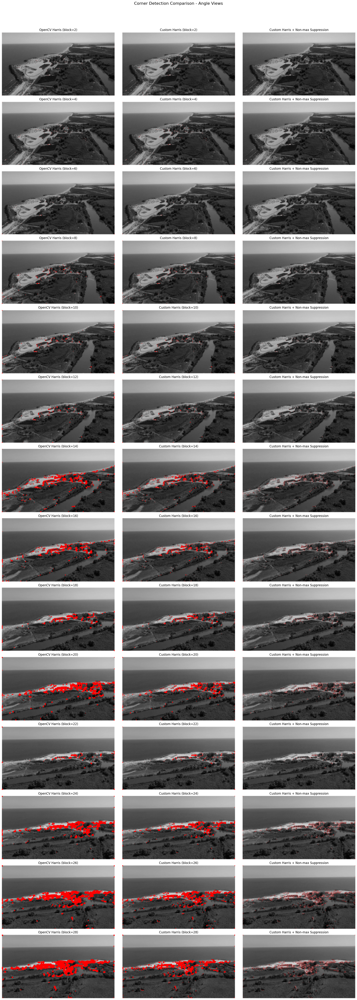

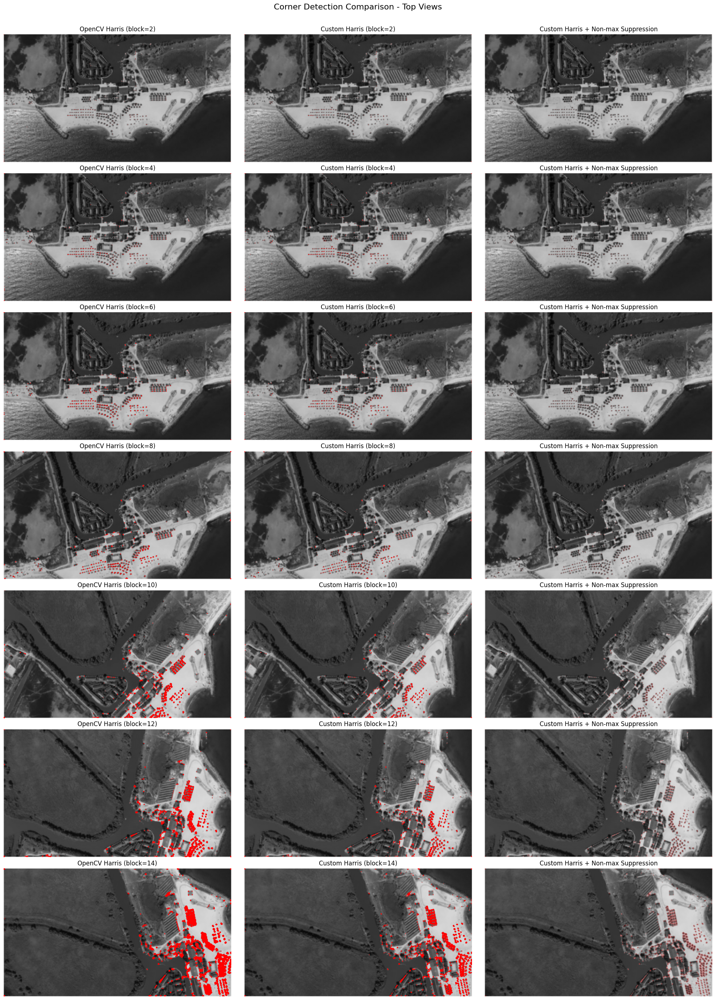

In [39]:
def nonmax_suppression(R: np.ndarray, radius: float) -> np.ndarray:
    """
    Keep only local maxima using the non-maximum suppression technique.
    
    Args:
        R: Response matrix from corner detection
        radius: Radius for suppression window
        
    Returns:
        Matrix with only local maxima preserved
    """
    # Create output and mask arrays
    res = np.zeros_like(R)
    used = np.zeros_like(R, dtype=bool)  # Using boolean for efficiency
    
    # Get coordinates and values in descending order
    coords = np.column_stack(np.nonzero(R))  # Only process non-zero elements
    values = R[coords[:, 0], coords[:, 1]]
    order = np.argsort(-values)  # Descending order
    
    # Process points in order of decreasing response
    for idx in order:
        i, j = coords[idx]
        
        # Skip if already used
        if used[i, j]:
            continue
        
        # Keep this maximum
        res[i, j] = R[i, j]
        
        # Mark neighborhood as used
        i_min = max(0, i - radius)
        i_max = min(used.shape[0], i + radius + 1)
        j_min = max(0, j - radius)
        j_max = min(used.shape[1], j + radius + 1)
        
        used[i_min:i_max, j_min:j_max] = True
    
    return res

def process_image_set(imgs: dict, title: str, output_filename: str) -> None:
    """
    Process a set of images with different corner detection methods.
    
    Args:
        imgs: Dictionary of images to process
        title: Title for the comparison figure
        output_filename: Filename to save the resulting figure
    """
    HARRIS_K = 0.04
    # Ensure odd numbers for neighbourhoods
    NEIGHBOURHOODS = range(2, 2 * (len(imgs) + 1) + 1, 2)  # Start at 3, increment by 2
    THRESHOLD = 0.01
    NONMAX_RADIUS = 1

    # Create figure with proper sizing
    fig, ax = plt.subplots(nrows=len(imgs), ncols=3, figsize=(20, len(imgs)*4))
    fig.suptitle(title, fontsize=16)

    # Process each image
    for i, (name, img) in enumerate(imgs.items()):
        # Skip if image is empty or None
        if img is None or img.size == 0:
            print(f"Skipping {name}: Invalid image")
            continue
            
        # Convert to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        try:
            # Method 1: OpenCV Harris
            R = cv2.cornerHarris(np.float32(gray_img), NEIGHBOURHOODS[i], 3, HARRIS_K)
            if R is not None and R.size > 0:
                R[R <= THRESHOLD * R.max()] = 0
                ax[i, 0].imshow(color_corners(gray_img, R))
                ax[i, 0].set_title(
                    f"OpenCV Harris (block={NEIGHBOURHOODS[i]})",
                    fontsize=12
                )
            
            # Method 2: Custom Harris
            R = my_corners_optimized(np.float32(gray_img), NEIGHBOURHOODS[i], HARRIS_K)
            if R is not None and R.size > 0:
                R[R <= THRESHOLD * R.max()] = 0
                ax[i, 1].imshow(color_corners(gray_img, R))
                ax[i, 1].set_title(
                    f"Custom Harris (block={NEIGHBOURHOODS[i]})",
                    fontsize=12
                )
            
            # Method 3: Custom Harris + Non-max Suppression
            R_suppressed = nonmax_suppression(R.copy(), NONMAX_RADIUS)
            if R_suppressed is not None and R_suppressed.size > 0:
                ax[i, 2].imshow(color_corners(gray_img, R_suppressed))
                ax[i, 2].set_title(
                    "Custom Harris + Non-max Suppression",
                    fontsize=12
                )
            
            # Add image name as row label
            ax[i, 0].set_ylabel(name, fontsize=12, rotation=0, labelpad=50)
            
        except Exception as e:
            print(f"Error processing {name}: {str(e)}")
            continue

    # Turn off axes for all subplots
    for a in ax.ravel():
        a.set_axis_off()

    # Adjust layout
    plt.tight_layout()
    fig.subplots_adjust(top=0.95)  # Make room for suptitle

    # Save and show
    store_fig(fig, output_filename)
    plt.show()

# Process both image sets
process_image_set(
    imgs_angles, 
    "Corner Detection Comparison - Angle Views",
    "corners_comparison_angles.png"
)

process_image_set(
    imgs_top, 
    "Corner Detection Comparison - Top Views",
    "corners_comparison_top.png"
)


Starting panorama stitching with 7 images...
Using image 0 as center
Initialized panorama with center image

Processing right image 1
Finding descriptors for image pair...


Found 2141 keypoints in first image
Found 2085 keypoints in second image
Found 2141 raw matches
Filtered to 1491 good matches
Found 1491 matches between images
Successfully computed homography

Processing right image 2
Finding descriptors for image pair...
Found 2085 keypoints in first image
Found 2174 keypoints in second image
Found 2085 raw matches
Filtered to 1305 good matches
Found 1305 matches between images
Successfully computed homography

Processing right image 3
Finding descriptors for image pair...
Found 2174 keypoints in first image
Found 1999 keypoints in second image
Found 2174 raw matches
Filtered to 1284 good matches
Found 1284 matches between images
Successfully computed homography

Processing right image 4
Finding descriptors for image pair...
Found 1999 keypoints in first image
Found 1647 keypoints in second image
Found 1999 raw matches
Filtered to 1015 good matches
Found 1015 matches between images
Successfully computed homography

Processing right image 5
Finding de

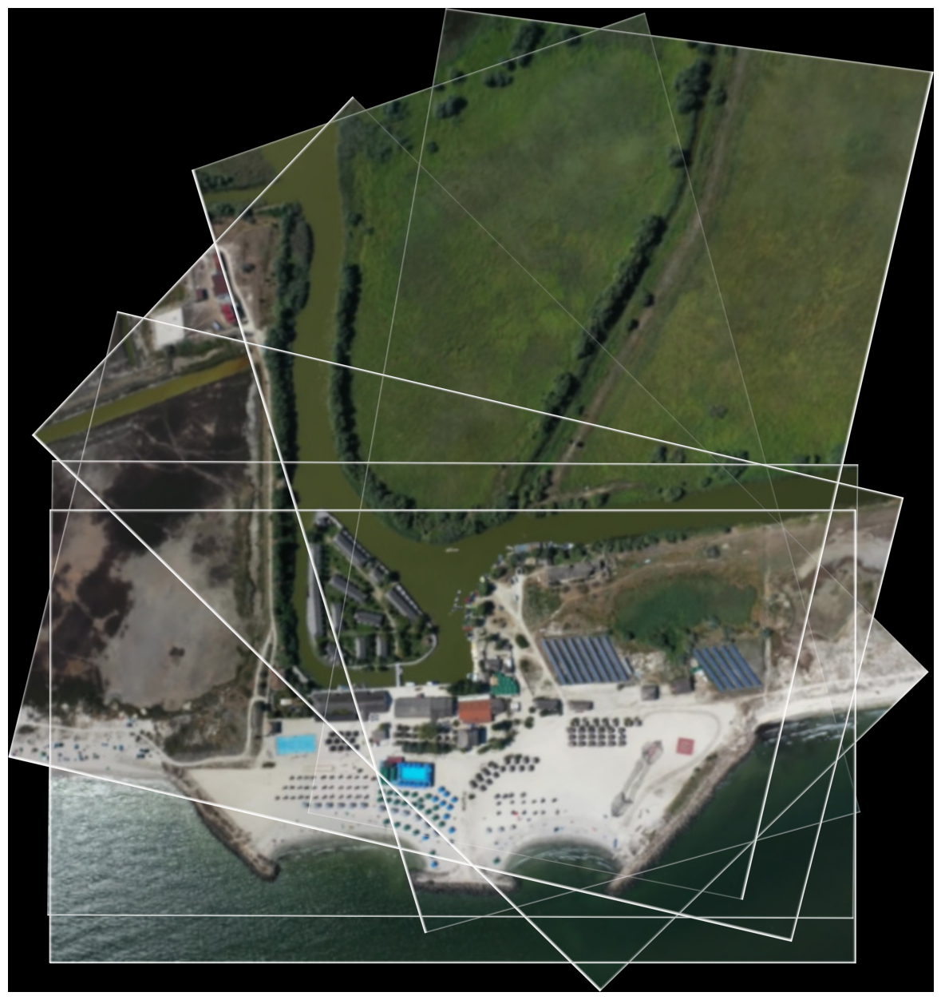


Starting panorama stitching with 14 images...
Using image 0 as center
Initialized panorama with center image

Processing right image 1
Finding descriptors for image pair...
Found 838 keypoints in first image
Found 819 keypoints in second image
Found 838 raw matches
Filtered to 667 good matches
Found 667 matches between images
Successfully computed homography

Processing right image 2
Finding descriptors for image pair...
Found 819 keypoints in first image
Found 772 keypoints in second image
Found 819 raw matches
Filtered to 322 good matches
Found 322 matches between images
Successfully computed homography

Processing right image 3
Finding descriptors for image pair...
Found 772 keypoints in first image
Found 787 keypoints in second image
Found 772 raw matches
Filtered to 288 good matches
Found 288 matches between images
Successfully computed homography

Processing right image 4
Finding descriptors for image pair...
Found 787 keypoints in first image
Found 744 keypoints in second image

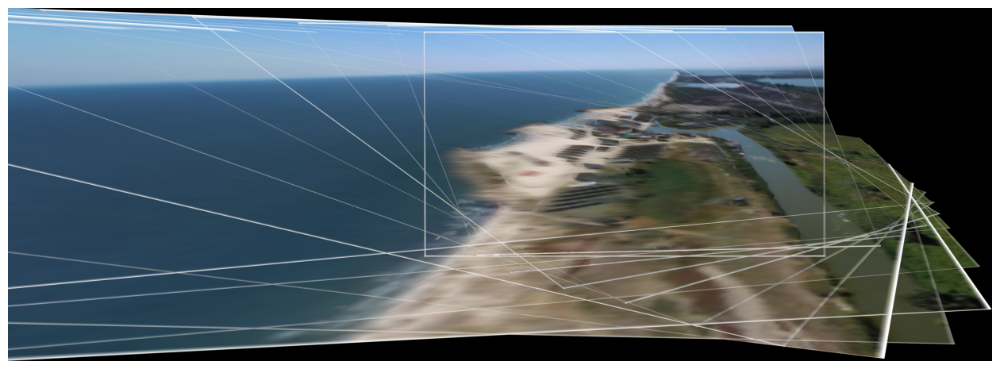


Starting panorama stitching with 8 images...
Using image 4 as center
Initialized panorama with center image

Processing left image 3
Finding descriptors for image pair...
Found 649 keypoints in first image
Found 671 keypoints in second image
Found 649 raw matches
Filtered to 243 good matches
Found 243 matches between images
Successfully computed homography

Processing left image 2
Finding descriptors for image pair...
Found 671 keypoints in first image
Found 662 keypoints in second image
Found 671 raw matches
Filtered to 269 good matches
Found 269 matches between images
Successfully computed homography

Processing left image 1
Finding descriptors for image pair...
Found 662 keypoints in first image
Found 744 keypoints in second image
Found 662 raw matches
Filtered to 274 good matches
Found 274 matches between images
Successfully computed homography

Processing left image 0
Finding descriptors for image pair...
Found 744 keypoints in first image
Found 787 keypoints in second image
Foun

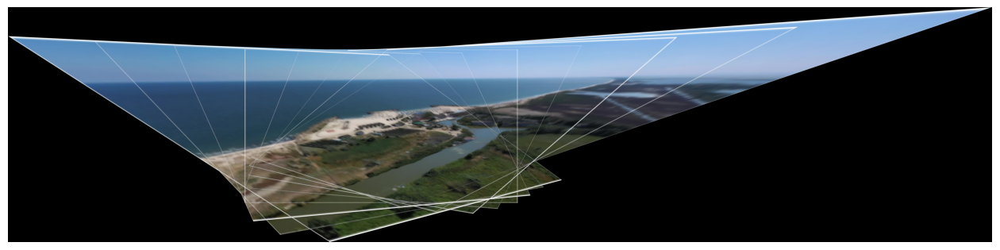


Starting panorama stitching with 8 images...
Using image 7 as center
Initialized panorama with center image

Processing left image 6
Finding descriptors for image pair...
Found 701 keypoints in first image
Found 713 keypoints in second image
Found 701 raw matches
Filtered to 246 good matches
Found 246 matches between images
Successfully computed homography

Processing left image 5
Finding descriptors for image pair...
Found 713 keypoints in first image
Found 675 keypoints in second image
Found 713 raw matches
Filtered to 253 good matches
Found 253 matches between images
Successfully computed homography

Processing left image 4
Finding descriptors for image pair...
Found 675 keypoints in first image
Found 649 keypoints in second image
Found 675 raw matches
Filtered to 227 good matches
Found 227 matches between images
Successfully computed homography

Processing left image 3
Finding descriptors for image pair...
Found 649 keypoints in first image
Found 671 keypoints in second image
Foun

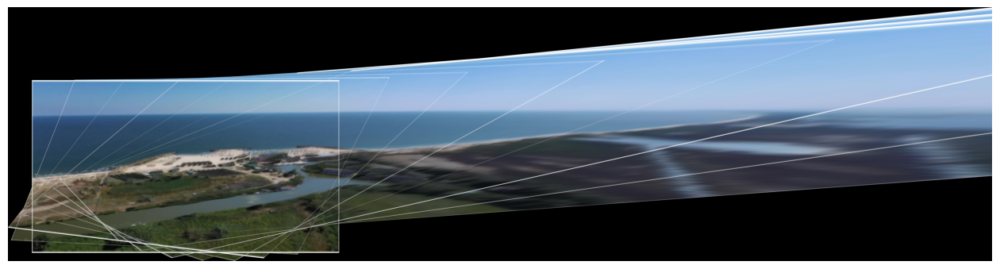

In [ ]:
PANORAMA_HEIGHT = 8000
PANORAMA_WIDTH = 8000

def show_panorama(imgs: Union[dict, List[np.ndarray]], start: int, name: str) -> None:
    """
    Create and display a panorama from images.
    
    Args:
        imgs: Dictionary of images or list of images
        start: Index of the center image
        name: Name for the output file
    """
    # Convert input to list of images
    if isinstance(imgs, dict):
        img_list = list(imgs.values())
    elif isinstance(imgs, list):
        img_list = imgs
    else:
        raise ValueError("Input must be either a dictionary or list of images")
    
    if not img_list:
        raise ValueError("No images provided")
    
    try:
        # Create panorama
        merged = stitch_all(img_list, PANORAMA_HEIGHT, PANORAMA_WIDTH, start)
        print(f"Panorama created with shape: {merged.shape}, dtype: {merged.dtype}")
        
        # Crop the panorama
        merged = crop_image(merged)
        print(f"Cropped panorama shape: {merged.shape}")
        
        # Ensure the image is in the correct format
        if merged.dtype != np.uint8:
            merged = np.clip(merged, 0, 255).astype(np.uint8)
        
        # Save the image
        output_path = f"panorama_{name}.png"
        cv2.imwrite(output_path, cv2.cvtColor(merged, cv2.COLOR_RGB2BGR))
        print(f"Saved panorama to {output_path}")
        
        # Display the image
        plt.figure(figsize=(16, 16))
        plt.imshow(merged)
        plt.axis('off')
        plt.show()
        plt.close()
        
    except Exception as e:
        print(f"Error in show_panorama: {str(e)}")
        import traceback
        traceback.print_exc()
        raise

# Process the panoramas
try:
    # Convert dictionaries to lists for slicing
    imgs_top_list = list(imgs_top.values())
    imgs_angles_list = list(imgs_angles.values())
    
    # Process different panoramas
    show_panorama(imgs_top, 0, "top")
    show_panorama(imgs_angles, 0, "angle")
    show_panorama(imgs_angles_list[3:-3], len(imgs_angles_list[3:-3]) // 2, "angle_mid")
    show_panorama(imgs_angles_list[-11:-3], len(imgs_angles_list[-11:-3]) - 1, "angle_reverse")
    
except Exception as e:
    print(f"Fatal error in panorama creation: {str(e)}")
    import traceback
    traceback.print_exc()